<a href="https://colab.research.google.com/github/luisam19/LSH_Images/blob/main/Proyecto_LSH_images_202402.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<p><img alt="udeA logo" height="150px" src="https://github.com/freddyduitama/images/blob/master/logo.png?raw=true" align="left" hspace="50px" vspace="0px" style="width:107px;height:152px;"></p>
<h1><font color='0B5345'> <center>
Big Data - Universidad de Antioquia</center></font></h1>
<h2><font color='0B5345'> <center>
LSH en Imagenes </center></font></h2>
<h3><font color='0B5345'> <center>
Isabella Ariza Cuberos - Luisa María Zapata Saldarriaga </center></font></h3>
<h3><font color='0B5345'> <center>
2024 </center></font></h3>
<font  face="Courier New" size="3">
<p1><center> </center></p1>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


https://github.com/mendesk/image-ndd-lsh/tree/master?tab=readme-ov-file

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelBinarizer
from keras.applications.xception import Xception,preprocess_input
import tensorflow as tf
from keras.preprocessing import image
from keras.layers import Input
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow


In [ ]:
!unzip "/content/drive/MyDrive/BigData/caltech-101.zip" -d "/content/"

Archive:  /content/drive/MyDrive/BigData/caltech-101.zip
   creating: /content/caltech-101/
  inflating: /content/__MACOSX/._caltech-101  
  inflating: /content/caltech-101/101_ObjectCategories.tar.gz  
  inflating: /content/__MACOSX/caltech-101/._101_ObjectCategories.tar.gz  
  inflating: /content/caltech-101/show_annotation.m  
  inflating: /content/__MACOSX/caltech-101/._show_annotation.m  
  inflating: /content/caltech-101/Annotations.tar  
  inflating: /content/__MACOSX/caltech-101/._Annotations.tar  


In [ ]:
!pip install datasketch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 kB 2.2 MB/s eta 0:00:00


In [ ]:
!git clone https://github.com/mendesk/image-ndd-lsh.git
%cd image-ndd-lsh
!pip install -r requirements.txt


Cloning into 'image-ndd-lsh'...
remote: Enumerating objects: 33, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 33 (delta 4), reused 13 (delta 4), pack-reused 18 (from 1)
Receiving objects: 100% (33/33), 16.45 MiB | 37.94 MiB/s, done.
Resolving deltas: 100% (6/6), done.
/content/image-ndd-lsh
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 61.6 MB/s eta 0:00:00


## Importing Libraries

In [ ]:
import tarfile
with tarfile.open('/content/caltech-101/101_ObjectCategories.tar.gz', 'r:gz') as tar:
    tar.extractall()

## Loading and Preprocessing of Data

In [ ]:
def preprocess_img(img_path):
  dsize = (299,299)
  new_image=cv2.imread(img_path)
  new_image=cv2.resize(new_image,dsize,interpolation=cv2.INTER_NEAREST)
  new_image=np.expand_dims(new_image,axis=0)
  new_image=preprocess_input(new_image)
  return new_image

def load_data():
    output = []
    pp=[]
    directory = "/content/image-ndd-lsh/101_ObjectCategories/bonsai"
    categories=sorted(os.listdir(directory))
    for files in sorted(os.listdir(directory)):
      img_path=directory+"/"+files
      output.append(img_path)
    print(output)
    return output

## Defining model and extracting feature for all the training data.

In [ ]:
def model():
  model=Xception(weights='imagenet',include_top=False)
  for layer in model.layers:
    layer.trainable=False
  #model.summary()
  return model

def feature_extraction(image_data,model):
  features=model.predict(image_data)
  features=np.array(features)
  features=features.flatten()
  return features

## Finding the similar image through LSH and cosine similarity.


In [ ]:
def result_vector_cosine(model,feature_vector,new_img):
  new_feature = model.predict(new_img)
  new_feature = np.array(new_feature)
  new_feature = new_feature.flatten()
  N_result = 6
  nbrs = NearestNeighbors(n_neighbors=N_result, metric="cosine").fit(feature_vector)
  distances, indices = nbrs.kneighbors([new_feature])
  return(indices)

from datasketch import MinHash, MinHashLSH
import numpy as np

def result_vector_lsh(model, feature_vec, img_paths, new_img):
    k = 10  # Número de bits de hash
    L = 5   # Número de tablas hash

    # Crea una tabla LSH con MinHash
    lsh = MinHashLSH(threshold=0.5, num_perm=k)

    # Insertamos las imágenes en la tabla LSH
    for img_path, vec in zip(img_paths, feature_vec):
        m = MinHash(num_perm=k)
        for feature in vec.flatten():
            m.update(str(feature).encode('utf8'))
        lsh.insert(img_path, m)

    # Predicción para la nueva imagen
    new_feature = model.predict(new_img).flatten()
    m_new = MinHash(num_perm=k)
    for feature in new_feature:
        m_new.update(str(feature).encode('utf8'))

    # Realiza la consulta
    response = lsh.query(m_new)

    return response


def result_vector_cosine(model, feature_vector, new_img):
    new_feature = model.predict(new_img)
    new_feature = np.array(new_feature).flatten()

    N_result = 6  # Número de imágenes similares a recuperar
    nbrs = NearestNeighbors(n_neighbors=N_result, metric="cosine").fit(feature_vector)
    distances, indices = nbrs.kneighbors([new_feature])

    # Convertir distancias de coseno a porcentaje de similitud
    similarity_percentages = 100 * (1 - distances)
    print(similarity_percentages)
    # Retornar los índices de las imágenes similares y los porcentajes de similitud
    return indices, similarity_percentages



## Result

['/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0002.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0003.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0004.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0005.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0006.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0007.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0008.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0009.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0010.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0011.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0012.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0013.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0014.jpg', '/content/image-ndd-lsh/101_Objec

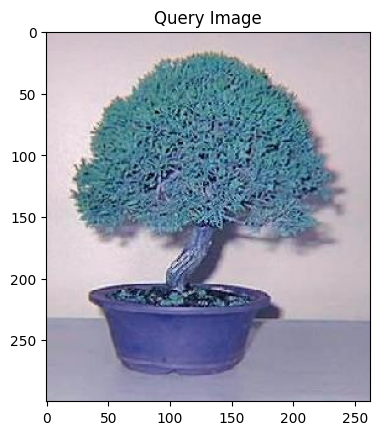

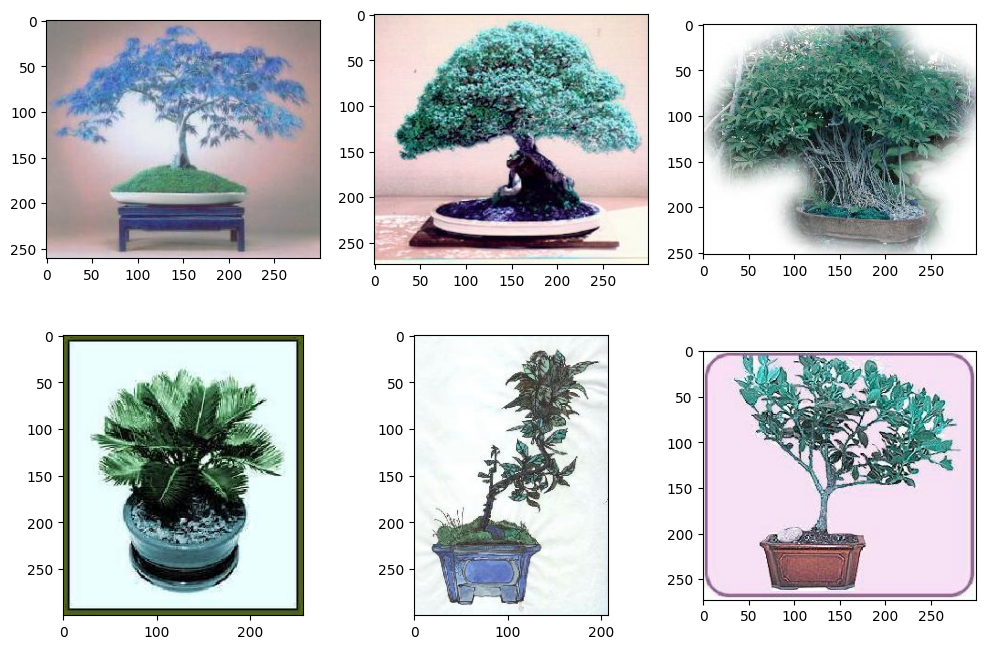

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from datasketch import MinHash, MinHashLSH

# Mostrar la imagen de consulta
def input_show(data):
    plt.title("Query Image")
    plt.imshow(data)

# Mostrar los resultados de las imágenes similares
def show_result(data,result, similarity_percentages):
  fig = plt.figure(figsize=(12,8))
  for i in range(0,6):
    index_result=result[0][i]
    plt.subplot(2,3,i+1)
    plt.imshow(cv2.imread(data[index_result]),label=similarity_percentages[0][i])
  plt.show()

def main():
    features = []
    output = load_data()
    main_model = model()

    # Limitar los datos para entrenar
    for i in output[:99]:
        new_img = preprocess_img(i)
        features.append(feature_extraction(new_img, main_model))

    feature_vec = np.array(features)
    result, similitud = result_vector_cosine(main_model, feature_vec, preprocess_img(output[118]))
    input_show(cv2.imread(output[118]))  # Mostrar la imagen de consulta
    show_result(output, result,similitud)  # Mostrar las imágenes similares con % de similitud

if __name__ == '__main__':
    main()


## LSH

In [ ]:
'''
Script adaptado de https://github.com/mendesk/image-ndd-lsh/tree/master?tab=readme-ov-file
'''
import argparse
import sys
from os import listdir
from os.path import isfile, join
from typing import Dict, List, Tuple

import imagehash
import numpy as np
from PIL import Image


def calculate_signature(image_file: str, hash_size: int) -> np.ndarray:
    """
    Calculate the dhash signature of a given file

    Args:
        image_file: the image (path as string) to calculate the signature for
        hash_size: hash size to use, signatures will be of length hash_size^2

    Returns:
        Image signature as Numpy n-dimensional array or None if the file is not a PIL recognized image
    """
    pil_image = Image.open(image_file).convert("L").resize(
                        (hash_size+1, hash_size),
                        Image.Resampling.LANCZOS)
    dhash = imagehash.dhash(pil_image, hash_size)
    signature = dhash.hash.flatten()
    pil_image.close()
    return signature


def find_near_duplicates(input_dir: str, threshold: float, hash_size: int, bands: int) -> List[Tuple[str, str, float]]:
    """
    Find near-duplicate images

    Args:
        input_dir: Directory with images to check
        threshold: Images with a similarity ratio >= threshold will be considered near-duplicates
        hash_size: Hash size to use, signatures will be of length hash_size^2
        bands: The number of bands to use in the locality sensitve hashing process

    Returns:
        A list of near-duplicates found. Near duplicates are encoded as a triple: (filename_A, filename_B, similarity)
    """
    rows: int = int(hash_size**2/bands)
    signatures = dict()
    hash_buckets_list: List[Dict[str, List[str]]] = [dict() for _ in range(bands)]

    # Build a list of candidate files in given input_dir
    file_list = [join(input_dir, f) for f in listdir(input_dir) if isfile(join(input_dir, f))]

    # Iterate through all files in input directory
    for fh in file_list:
        try:
            signature = calculate_signature(fh, hash_size)
        except IOError:
            # Not a PIL image, skip this file
            continue

        # Keep track of each image's signature
        signatures[fh] = np.packbits(signature)

        # Locality Sensitive Hashing
        for i in range(bands):
            signature_band = signature[i*rows:(i+1)*rows]
            signature_band_bytes = signature_band.tobytes() # Key en Bytes
            if signature_band_bytes not in hash_buckets_list[i]:
                hash_buckets_list[i][signature_band_bytes] = list() # key nueva le agrega una lista vacía
            hash_buckets_list[i][signature_band_bytes].append(fh) # agrega el path de la imagen a la clave

    # Build candidate pairs based on bucket membership
    candidate_pairs = set()
    for hash_buckets in hash_buckets_list:
        for hash_bucket in hash_buckets.values():
            if len(hash_bucket) > 1: # diccionarios con valores que tuvieran más de 1 elemento
                hash_bucket = sorted(hash_bucket)
                for i in range(len(hash_bucket)):
                    for j in range(i+1, len(hash_bucket)):
                        candidate_pairs.add(
                            tuple([hash_bucket[i],hash_bucket[j]])
                        )
    print(f'Total candidate pairs: {len(candidate_pairs)}',candidate_pairs)
    # Check candidate pairs for similarity
    near_duplicates = list()
    for cpa, cpb in candidate_pairs:
        #La operación XOR, o "Exclusive OR", devuelve True (o 1) si los bits de los dos operandos son diferentes, y devuelve False (o 0) si los bits son iguales.
        hd = sum(np.bitwise_xor( # Aplica a las compuerta X0R
                np.unpackbits(signatures[cpa]),
                np.unpackbits(signatures[cpb])
        ))
        similarity = (hash_size**2 - hd) / hash_size**2
        if similarity > threshold:
            near_duplicates.append((cpa, cpb, similarity))

    # Sort near-duplicates by descending similarity and return
    near_duplicates.sort(key=lambda x:x[2], reverse=True)
    return near_duplicates


def main(argv):
    # Argument parser
    parser = argparse.ArgumentParser(description="Efficient detection of near-duplicate images using locality sensitive hashing")
    parser.add_argument("-i", "--inputdir", type=str, default="", help="directory containing images to check")
    parser.add_argument("-t", "--threshold", type=float, default=0.4, help="similarity threshold")
    parser.add_argument("-s", "--hash-size", type=int, default=16, help="hash size to use, signature length = hash_size^2", dest="hash_size")
    parser.add_argument("-b", "--bands", type=int, default=16, help="number of bands")

    args = parser.parse_args()
    input_dir = args.inputdir
    threshold = args.threshold
    hash_size = args.hash_size
    bands = args.bands

    try:
        near_duplicates = find_near_duplicates(input_dir, threshold, hash_size, bands)
        if near_duplicates:
            print(f"Found {len(near_duplicates)} near-duplicate images in {input_dir} (threshold {threshold:.2%})")
            for a,b,s in near_duplicates:
                print(f"{s:.2%} similarity: file 1: {a} - file 2: {b}")
        else:
            print(f"No near-duplicates found in {input_dir} (threshold {threshold:.2%})")
    except OSError:
        print(f"Couldn't open input directory {input_dir}")


# if __name__ == "__main__":
#     main(sys.argv)

Total candidate pairs: 9 {('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0026.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0092.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0051.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0119.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0019.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0088.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0021.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0042.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0061.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0111.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0046.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0108.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0023.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0091.j

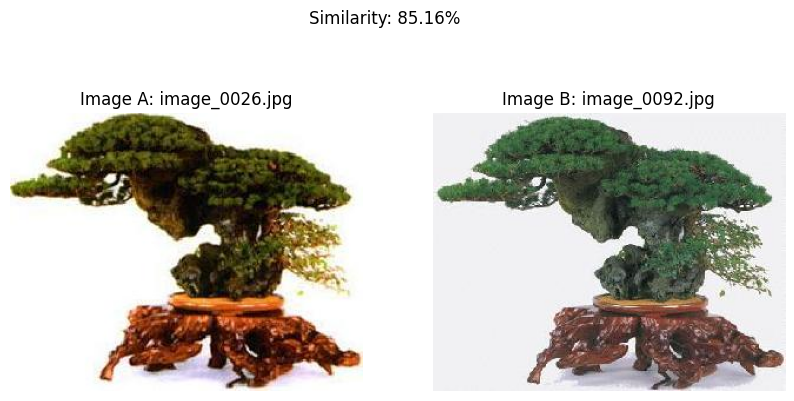

64.45% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0023.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0091.jpg


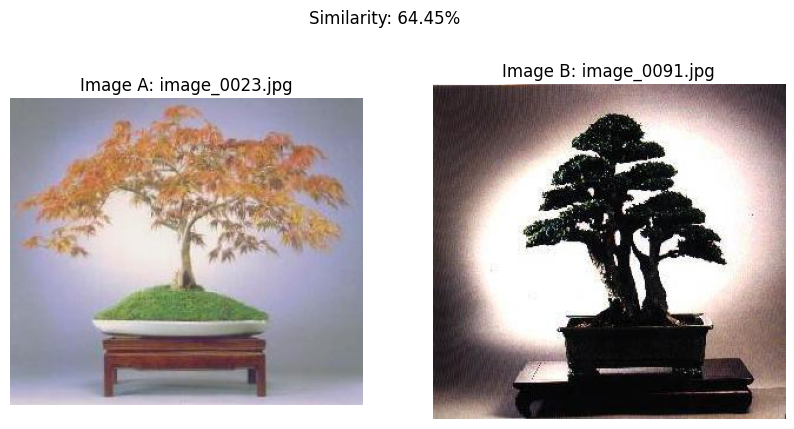

64.06% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0060.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0104.jpg


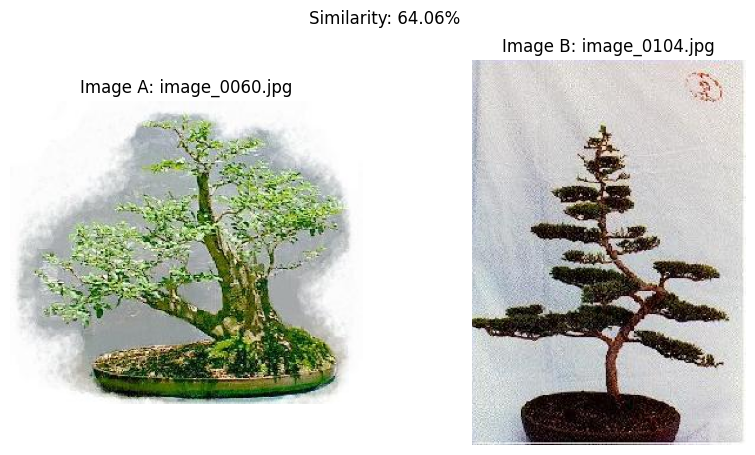

58.20% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0061.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0111.jpg


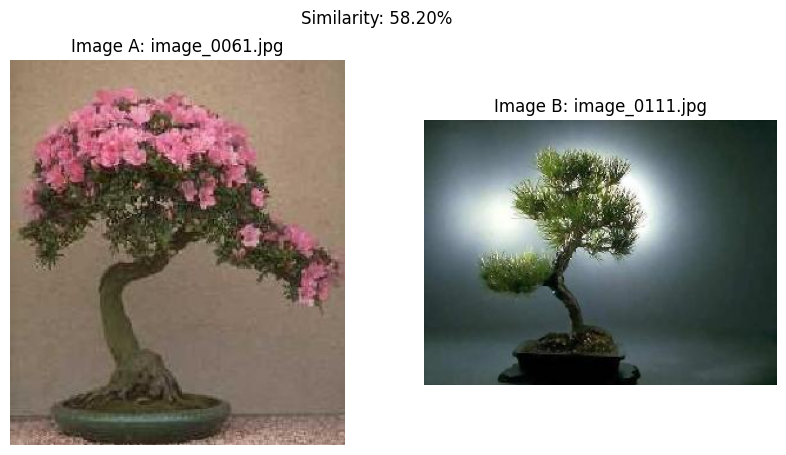

57.03% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0051.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0119.jpg


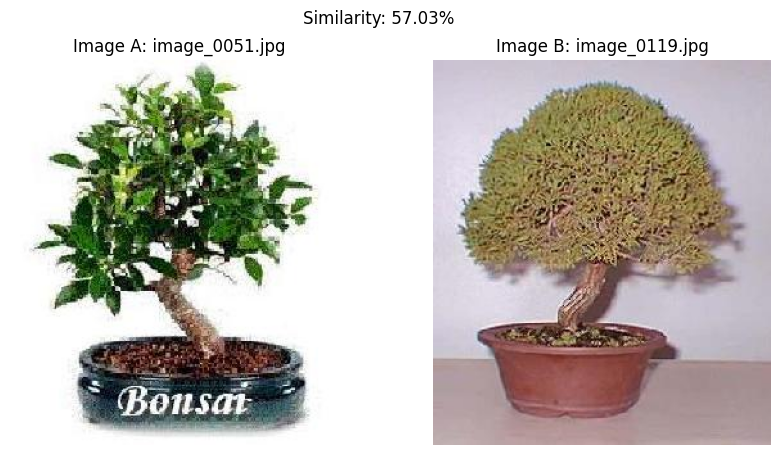

57.03% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0021.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0042.jpg


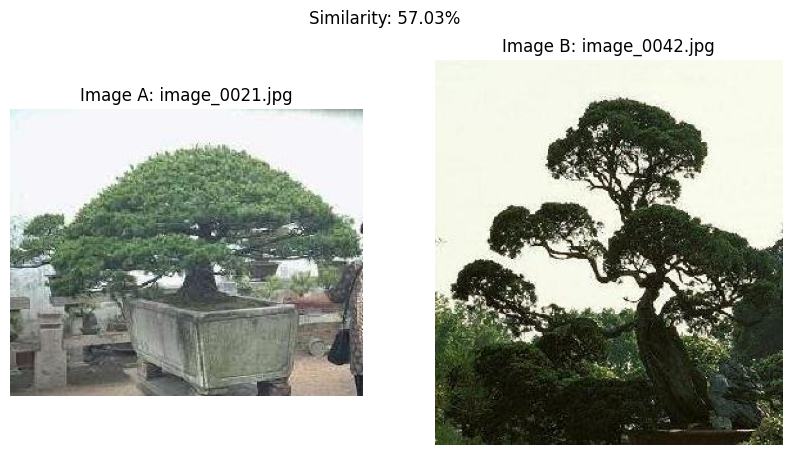

55.86% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0019.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0088.jpg


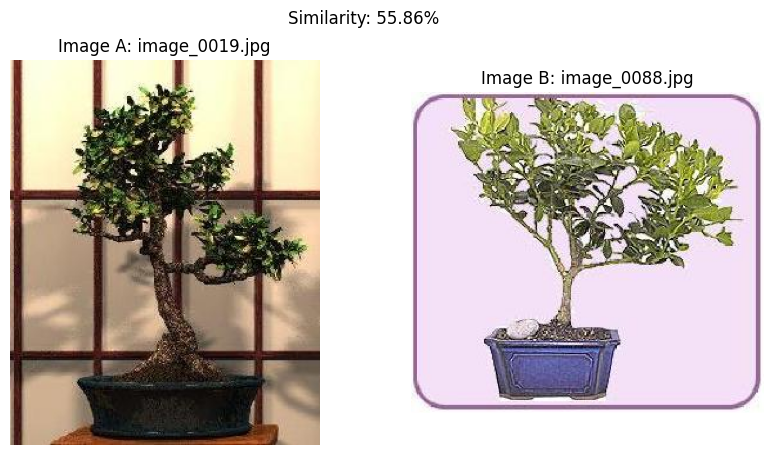

54.69% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0046.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0108.jpg


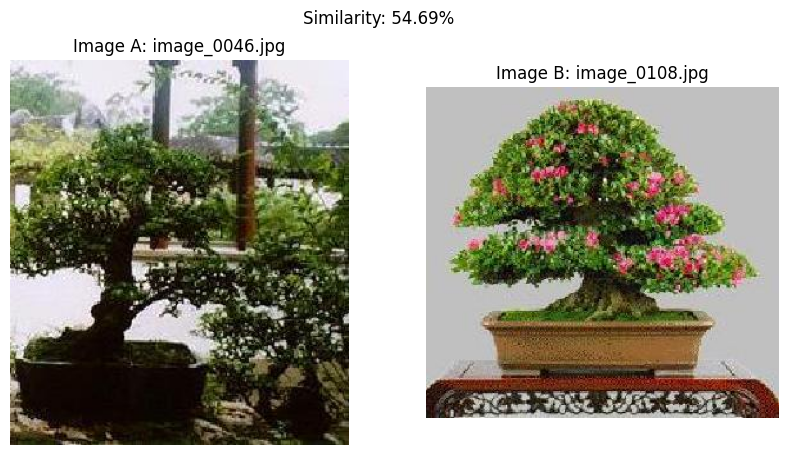

50.00% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0017.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0052.jpg


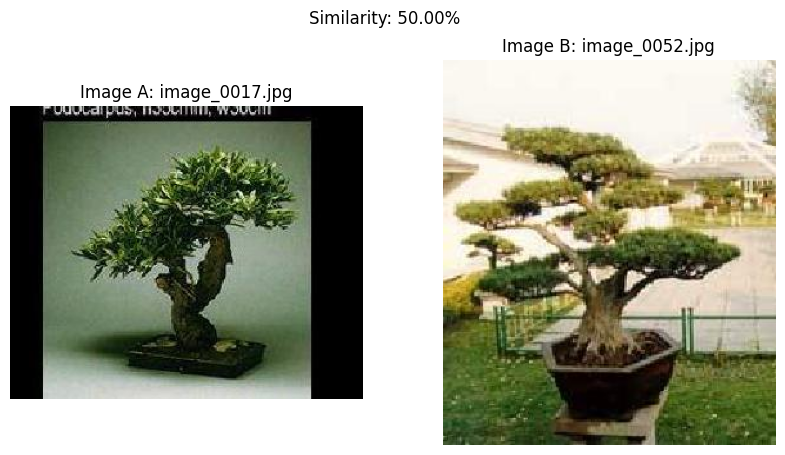

In [ ]:
input_dir = '/content/image-ndd-lsh/101_ObjectCategories/bonsai'
threshold = 0.4
hash_size = 16
bands = 16
near_duplicates = find_near_duplicates(input_dir, threshold, hash_size, bands)
if near_duplicates:
  print(f"Found {len(near_duplicates)} near-duplicate images in {input_dir} (threshold {threshold:.2%})")
  for a,b,s in near_duplicates:
    print(f"{s:.2%} similarity: file 1: {a} - file 2: {b}")
    # Cargar imágenes con PIL
    img_a = Image.open(a)
    img_b = Image.open(b)

    # Crear un subplot con 1 fila y 2 columnas para mostrar las imágenes
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Mostrar la primera imagen en el primer subplot
    ax[0].imshow(img_a)
    ax[0].set_title(f"Image A: {a.split('/')[-1]}")
    ax[0].axis('off')  # Quitar los ejes

    # Mostrar la segunda imagen en el segundo subplot
    ax[1].imshow(img_b)
    ax[1].set_title(f"Image B: {b.split('/')[-1]}")
    ax[1].axis('off')  # Quitar los ejes

    # Mostrar el gráfico
    plt.suptitle(f"Similarity: {s:.2%}")
    plt.show()
else:
  print(f"No near-duplicates found in {input_dir} (threshold {threshold:.2%})")

Total candidate pairs: 2 {('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg')}
Found 2 near-duplicate images in /content/image-ndd-lsh/101_ObjectCategories/bonsai (threshold 40.00%)
58.20% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg


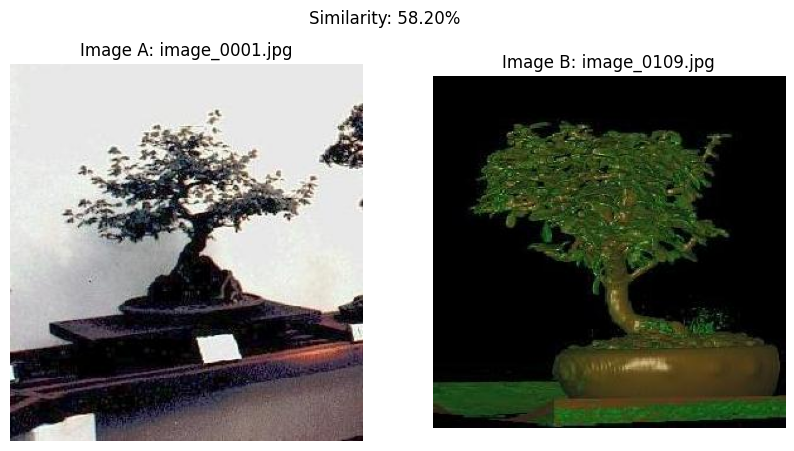

50.00% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg


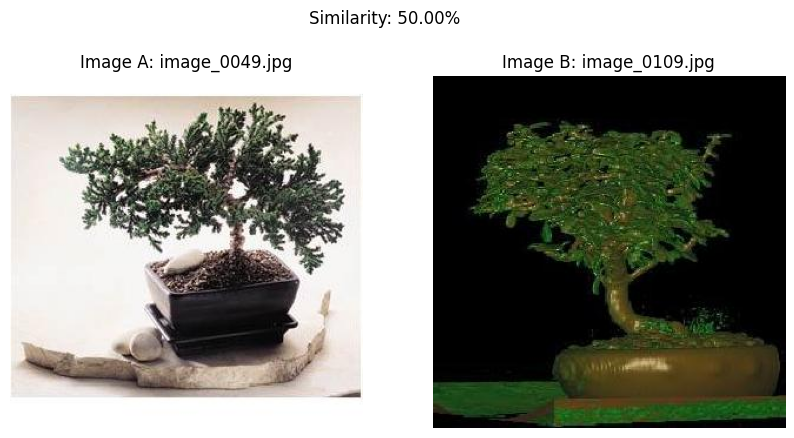

In [ ]:
input_dir = '/content/image-ndd-lsh/101_ObjectCategories/bonsai'
threshold = 0.4
# Mayor resolución mayor cantidad de información
hash_size = 32
bands = 32
near_duplicates = find_near_duplicates(input_dir, threshold, hash_size, bands)
if near_duplicates:
  print(f"Found {len(near_duplicates)} near-duplicate images in {input_dir} (threshold {threshold:.2%})")
  for a,b,s in near_duplicates:
    print(f"{s:.2%} similarity: file 1: {a} - file 2: {b}")
    img_a = Image.open(a)
    img_b = Image.open(b)

    # Crear un subplot con 1 fila y 2 columnas para mostrar las imágenes
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Mostrar la primera imagen en el primer subplot
    ax[0].imshow(img_a)
    ax[0].set_title(f"Image A: {a.split('/')[-1]}")
    ax[0].axis('off')  # Quitar los ejes

    # Mostrar la segunda imagen en el segundo subplot
    ax[1].imshow(img_b)
    ax[1].set_title(f"Image B: {b.split('/')[-1]}")
    ax[1].axis('off')  # Quitar los ejes

    # Mostrar el gráfico
    plt.suptitle(f"Similarity: {s:.2%}")
    plt.show()
else:
  print(f"No near-duplicates found in {input_dir} (threshold {threshold:.2%})")

Total candidate pairs: 13 {('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0117.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0110.jpg'), ('/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0110.jpg', '/content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.

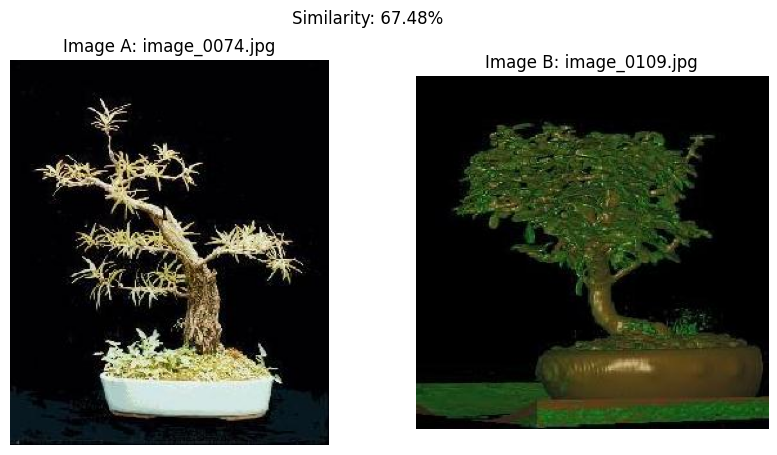

61.79% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg


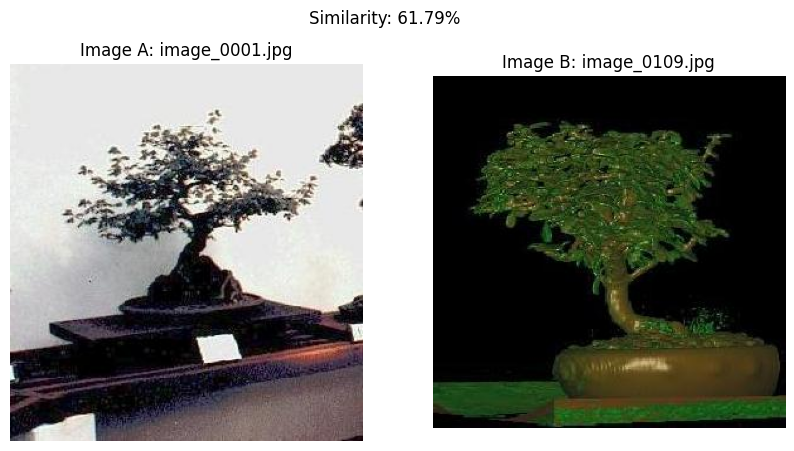

61.21% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0110.jpg


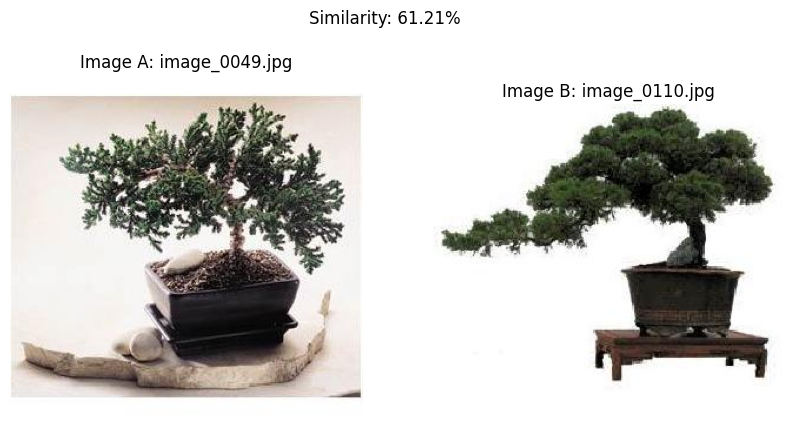

60.72% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg


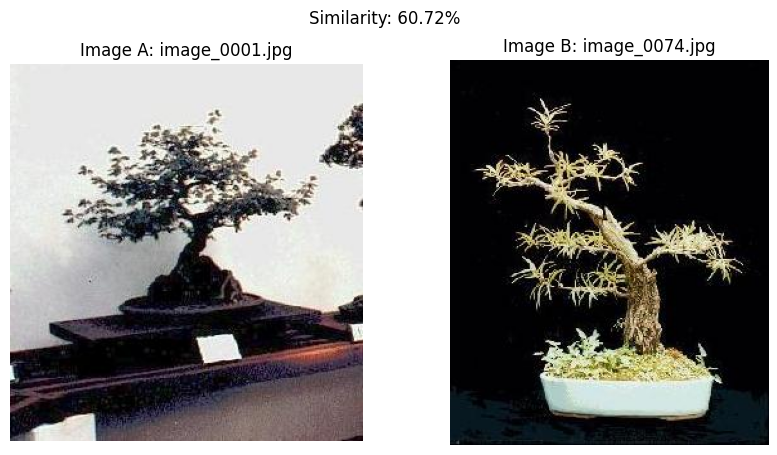

57.50% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg


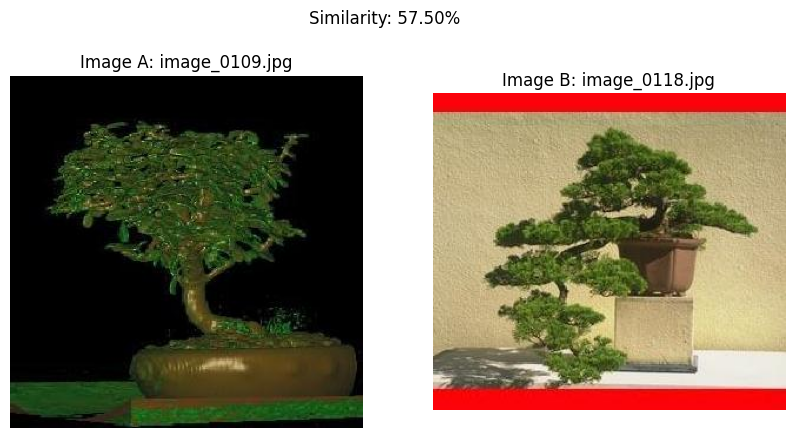

56.74% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0117.jpg


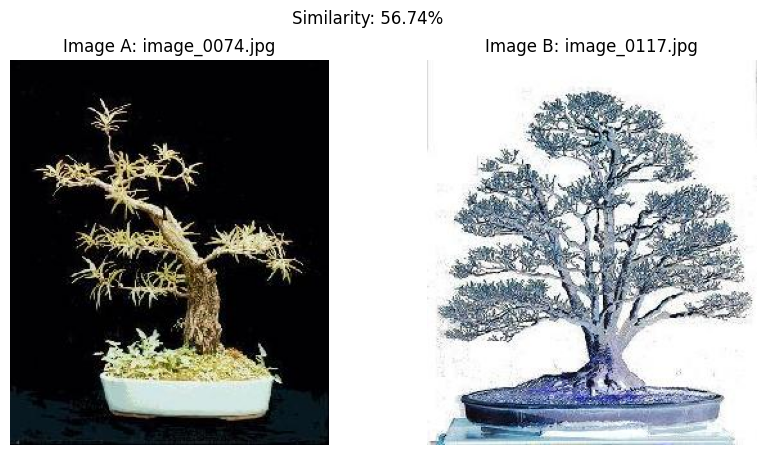

56.71% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg


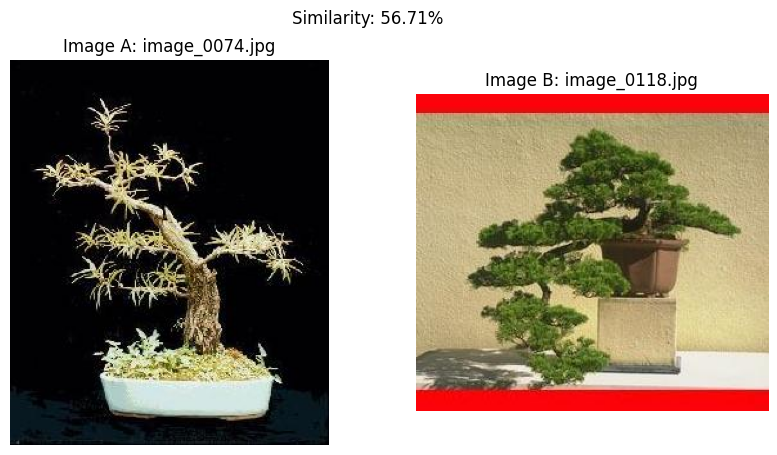

56.62% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0110.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg


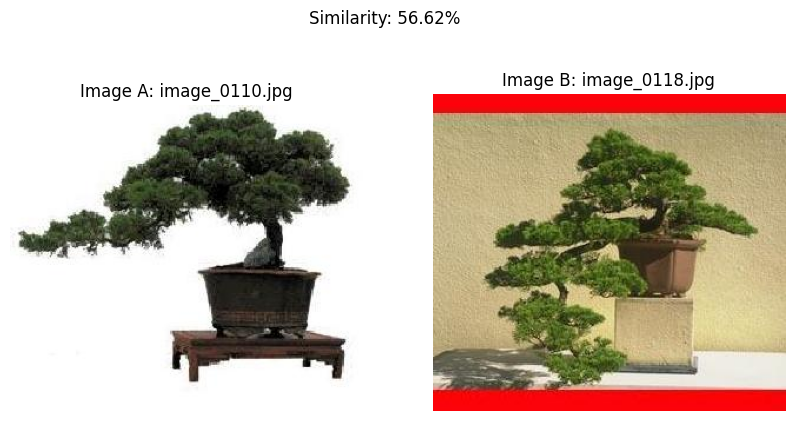

56.42% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0109.jpg


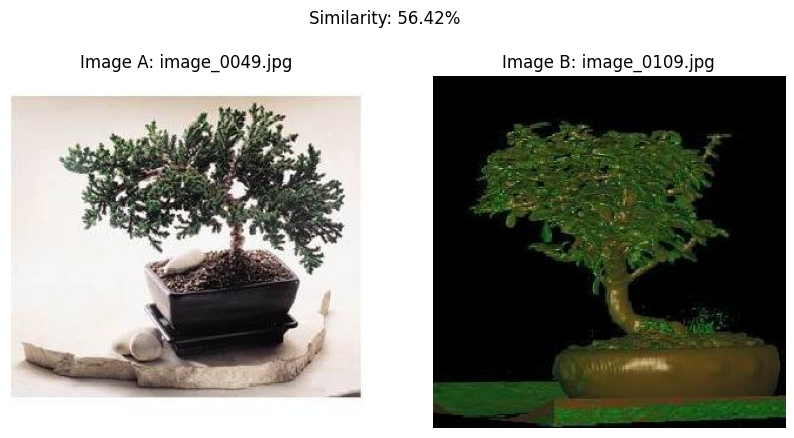

55.86% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg


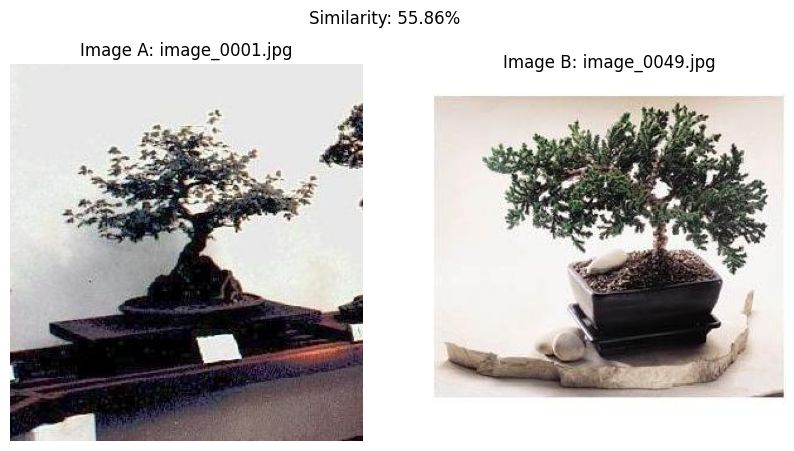

54.64% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg


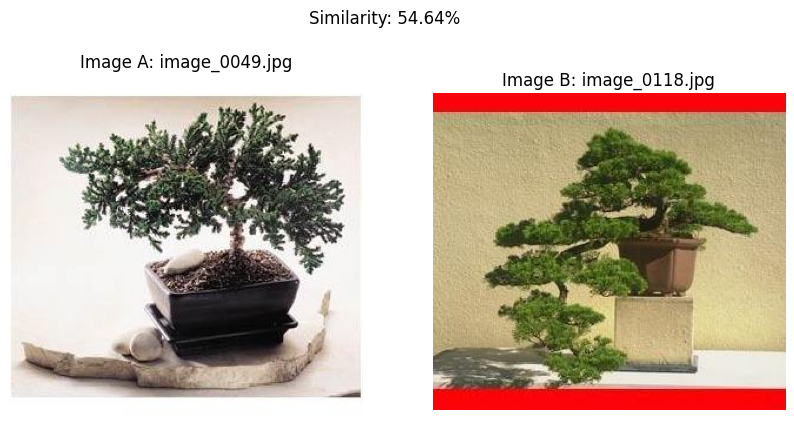

54.37% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0049.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0074.jpg


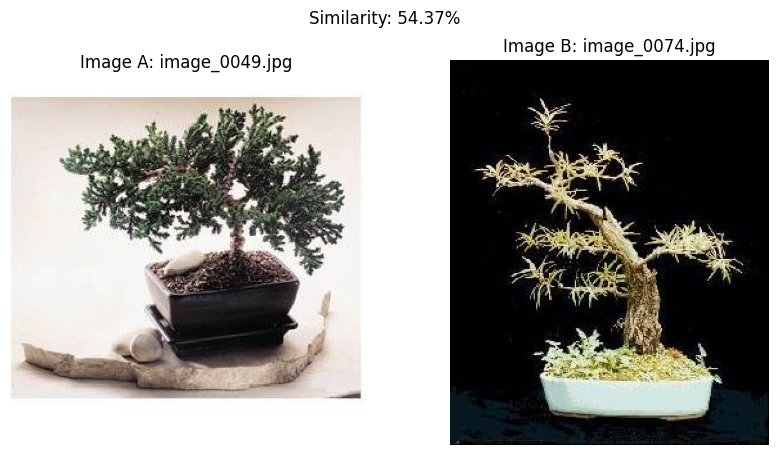

54.25% similarity: file 1: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0001.jpg - file 2: /content/image-ndd-lsh/101_ObjectCategories/bonsai/image_0118.jpg


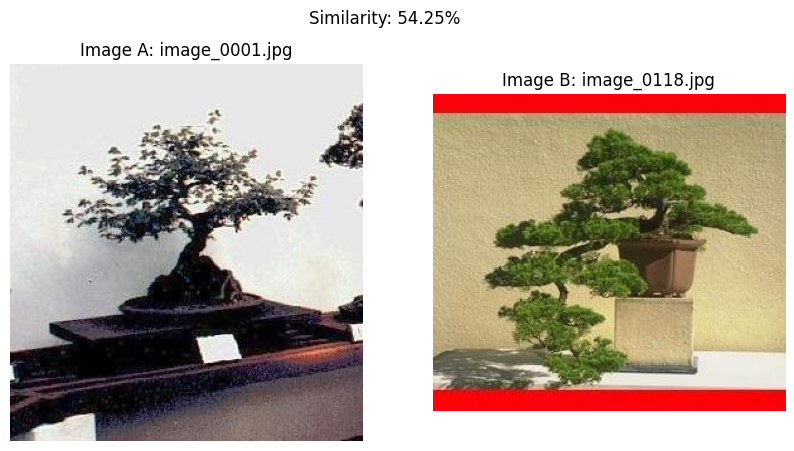

In [ ]:
input_dir = '/content/image-ndd-lsh/101_ObjectCategories/bonsai'
threshold = 0.4
# Mayor resolución mayor cantidad de información
hash_size = 64
bands = 64
near_duplicates = find_near_duplicates(input_dir, threshold, hash_size, bands)
if near_duplicates:
  print(f"Found {len(near_duplicates)} near-duplicate images in {input_dir} (threshold {threshold:.2%})")
  for a,b,s in near_duplicates:
    print(f"{s:.2%} similarity: file 1: {a} - file 2: {b}")
    img_a = Image.open(a)
    img_b = Image.open(b)

    # Crear un subplot con 1 fila y 2 columnas para mostrar las imágenes
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Mostrar la primera imagen en el primer subplot
    ax[0].imshow(img_a)
    ax[0].set_title(f"Image A: {a.split('/')[-1]}")
    ax[0].axis('off')  # Quitar los ejes

    # Mostrar la segunda imagen en el segundo subplot
    ax[1].imshow(img_b)
    ax[1].set_title(f"Image B: {b.split('/')[-1]}")
    ax[1].axis('off')  # Quitar los ejes

    # Mostrar el gráfico
    plt.suptitle(f"Similarity: {s:.2%}")
    plt.show()
else:
  print(f"No near-duplicates found in {input_dir} (threshold {threshold:.2%})")

Encontrar equilibrio entre la cantidad de bandas y row. Bandas son el parametro clave para disminuir la cantidad de falsos positvos.

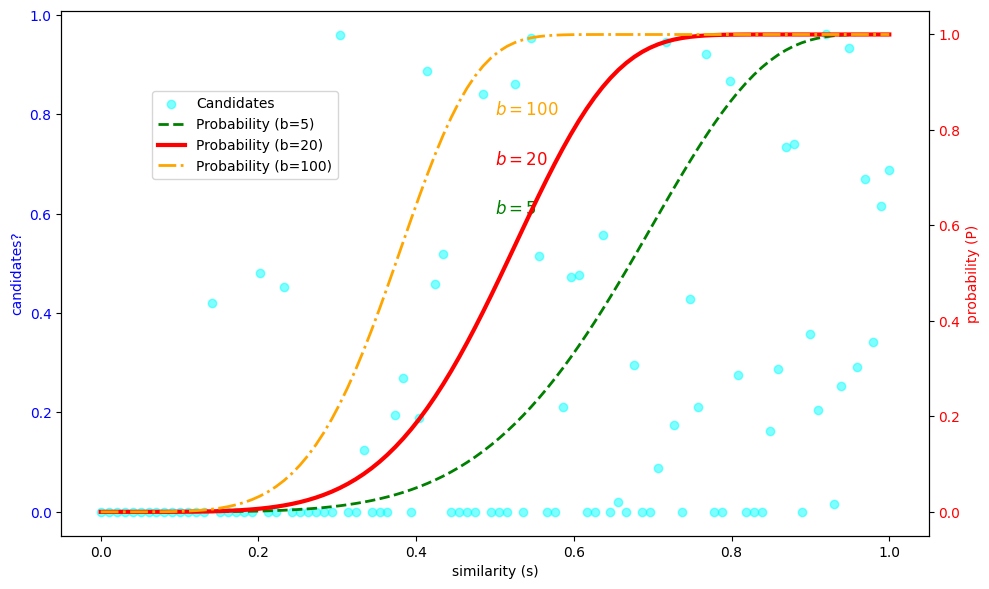

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definir la función de probabilidad según la fórmula dada
def hash_probability(s, r, b):
    return 1 - (1 - s**r)**b

# Crear datos de similitud
similarity = np.linspace(0, 1, 100)

# Parámetros
r = 5  # Este valor puede ajustarse según tu caso
b_values = [5, 20, 100]  # Tres valores de 'b' como ejemplo

# Calcular la probabilidad para cada valor de 'b'
prob_b5 = hash_probability(similarity, r, b_values[0])
prob_b20 = hash_probability(similarity, r, b_values[1])
prob_b100 = hash_probability(similarity, r, b_values[2])

# Crear puntos dispersos (simulación de candidatos)
candidates = (similarity > np.random.rand(100)) * np.random.rand(100)

# Graficar
fig, ax1 = plt.subplots(figsize=(10, 6))

# Graficar los puntos dispersos
ax1.scatter(similarity, candidates, color='cyan', alpha=0.5, label='Candidates')
ax1.set_xlabel('similarity (s)')
ax1.set_ylabel('candidates?', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Crear un segundo eje Y para la probabilidad
ax2 = ax1.twinx()
ax2.plot(similarity, prob_b5, color='green', linestyle='--', label=f'Probability (b={b_values[0]})', linewidth=2)
ax2.plot(similarity, prob_b20, color='red', label=f'Probability (b={b_values[1]})', linewidth=3)
ax2.plot(similarity, prob_b100, color='orange', linestyle='-.', label=f'Probability (b={b_values[2]})', linewidth=2)
ax2.set_ylabel('probability (P)', color='red')
ax2.tick_params(axis='y', labelcolor='red')

# Etiquetas en la gráfica
ax1.text(0.5, 0.6, r'$b=5$', fontsize=12, color='green')
ax1.text(0.5, 0.7, r'$b=20$', fontsize=12, color='red')
ax1.text(0.5, 0.8, r'$b=100$', fontsize=12, color='orange')

# Leyenda
fig.legend(loc="upper left", bbox_to_anchor=(0.15, 0.85))

# Ajustar layout
fig.tight_layout()

# Mostrar el gráfico
plt.show()
